In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import datetime 

In [2]:
covid_data = pd.read_csv(r"E:\web scrappping\covid_19_india.csv")

In [3]:
covid_data

,Sno,Date,Time,State/UnionTerritory,ConfirmedIndianNational,ConfirmedForeignNational,Cured,Deaths,Confirmed
0,1,2020-01-30,6:00 PM,Kerala,1,0,0,0,1
1,2,2020-01-31,6:00 PM,Kerala,1,0,0,0,1
2,3,2020-02-01,6:00 PM,Kerala,2,0,0,0,2
3,4,2020-02-02,6:00 PM,Kerala,3,0,0,0,3
4,5,2020-02-03,6:00 PM,Kerala,3,0,0,0,3
...,...,...,...,...,...,...,...,...,...
16845,16846,2021-07-07,8:00 AM,Telangana,-,-,613124,3703,628282
16846,16847,2021-07-07,8:00 AM,Tripura,-,-,63964,701,68612
16847,16848,2021-07-07,8:00 AM,Uttarakhand,-,-,332006,7338,340882
16848,16849,2021-07-07,8:00 AM,Uttar Pradesh,-,-,1682130,22656,1706818


In [4]:
covid_data.head(10)

,Sno,Date,Time,State/UnionTerritory,ConfirmedIndianNational,ConfirmedForeignNational,Cured,Deaths,Confirmed
0,1,2020-01-30,6:00 PM,Kerala,1,0,0,0,1
1,2,2020-01-31,6:00 PM,Kerala,1,0,0,0,1
2,3,2020-02-01,6:00 PM,Kerala,2,0,0,0,2
3,4,2020-02-02,6:00 PM,Kerala,3,0,0,0,3
4,5,2020-02-03,6:00 PM,Kerala,3,0,0,0,3
5,6,2020-02-04,6:00 PM,Kerala,3,0,0,0,3
6,7,2020-02-05,6:00 PM,Kerala,3,0,0,0,3
7,8,2020-02-06,6:00 PM,Kerala,3,0,0,0,3
8,9,2020-02-07,6:00 PM,Kerala,3,0,0,0,3
9,10,2020-02-08,6:00 PM,Kerala,3,0,0,0,3


In [5]:
covid_data.describe()

,Sno,Cured,Deaths,Confirmed
count,16850.000000,1.685000e+04,16850.000000,1.685000e+04
mean,8425.500000,2.360353e+05,3485.222552,2.583667e+05
std,4864.320353,5.225438e+05,9330.541749,5.672808e+05
min,1.000000,0.000000e+00,0.000000,0.000000e+00
25%,4213.250000,2.658500e+03,22.000000,3.644750e+03
50%,8425.500000,2.889500e+04,453.000000,3.336150e+04
75%,12637.750000,2.537510e+05,3071.250000,2.666530e+05
max,16850.000000,5.872268e+06,123531.000000,6.113335e+06


In [6]:
covid_data['Date'] = pd.to_datetime(covid_data['Date'],format = '%Y-%m-%d')

In [7]:
covid_data.drop(["Sno","Time","ConfirmedIndianNational","ConfirmedForeignNational"],inplace = True, axis = 1)

In [8]:
covid_data.head()

,Date,State/UnionTerritory,Cured,Deaths,Confirmed
0,2020-01-30,Kerala,0,0,1
1,2020-01-31,Kerala,0,0,1
2,2020-02-01,Kerala,0,0,2
3,2020-02-02,Kerala,0,0,3
4,2020-02-03,Kerala,0,0,3


In [9]:
#Active cases data
covid_data['Active_Cases'] = covid_data['Confirmed'] - (covid_data['Cured'] + covid_data['Deaths'])
covid_data.tail(10)

,Date,State/UnionTerritory,Cured,Deaths,Confirmed,Active_Cases
16840,2021-07-07,Puducherry,114673,1763,118227,1791
16841,2021-07-07,Punjab,578590,16131,596736,2015
16842,2021-07-07,Rajasthan,942882,8942,952836,1012
16843,2021-07-07,Sikkim,19200,309,21403,1894
16844,2021-07-07,Tamil Nadu,2435872,33132,2503481,34477
16845,2021-07-07,Telangana,613124,3703,628282,11455
16846,2021-07-07,Tripura,63964,701,68612,3947
16847,2021-07-07,Uttarakhand,332006,7338,340882,1538
16848,2021-07-07,Uttar Pradesh,1682130,22656,1706818,2032
16849,2021-07-07,West Bengal,1472132,17834,1507241,17275


In [10]:
total_cases_overall=covid_data['Active_Cases'].sum()
print('Total number of Active cases in India is',total_cases_overall)

Total number of Active cases in India is 317557938


In [40]:
px.scatter(x='State/UnionTerritory',y='Deaths',title='State wise Death',data_frame=covid_data)

In [41]:
px.scatter(x='Confirmed',y='Deaths',title='Deaths according to confirmed cases',data_frame=covid_data)

In [42]:
px.scatter(x='State/UnionTerritory',y='Active_Cases',title='State wise Active cases',data_frame=covid_data)

In [14]:
fig = px.histogram(x='State/UnionTerritory',data_frame=covid_data,title='State wise count')
fig.update_traces(marker_line_width=1,marker_line_color="red")

In [15]:
Total_active_cases=covid_data.groupby('State/UnionTerritory')['Active_Cases'].sum().sort_values(ascending=False).to_frame()

In [16]:
Total_active_cases

,Active_Cases
State/UnionTerritory,
Maharashtra,75789031
Karnataka,37129391
Kerala,31863648
Tamil Nadu,21030571
Andhra Pradesh,18243068
Uttar Pradesh,16966587
West Bengal,11311169
Rajasthan,10525506
Chhattisgarh,9997112


In [17]:
Total_active_cases.style.background_gradient(cmap='Reds')

,Active_Cases
State/UnionTerritory,
Maharashtra,75789031
Karnataka,37129391
Kerala,31863648
Tamil Nadu,21030571
Andhra Pradesh,18243068
Uttar Pradesh,16966587
West Bengal,11311169
Rajasthan,10525506
Chhattisgarh,9997112


In [18]:
px.bar(covid_data,x='State/UnionTerritory',y='Active_Cases')

In [43]:
px.scatter(x='Date',y='Deaths',title='Deaths according to confirmed cases',data_frame=covid_data)

In [20]:
px.scatter(x='Date',y='Active_Cases',title='Active Cases according to Date',data_frame=covid_data)

In [48]:
px.scatter(x='Date',y='Confirmed',title='Confirmed cases according to Date',data_frame=covid_data)

In [44]:
px.scatter(x='Date',y='Cured',title='cured according to Date',data_frame=covid_data)

In [23]:
fig=px.bar(covid_data,x='Date',y='Active_Cases',color='Deaths')
fig.show()

In [24]:
px.pie(names='State/UnionTerritory',values='Active_Cases',data_frame=covid_data)

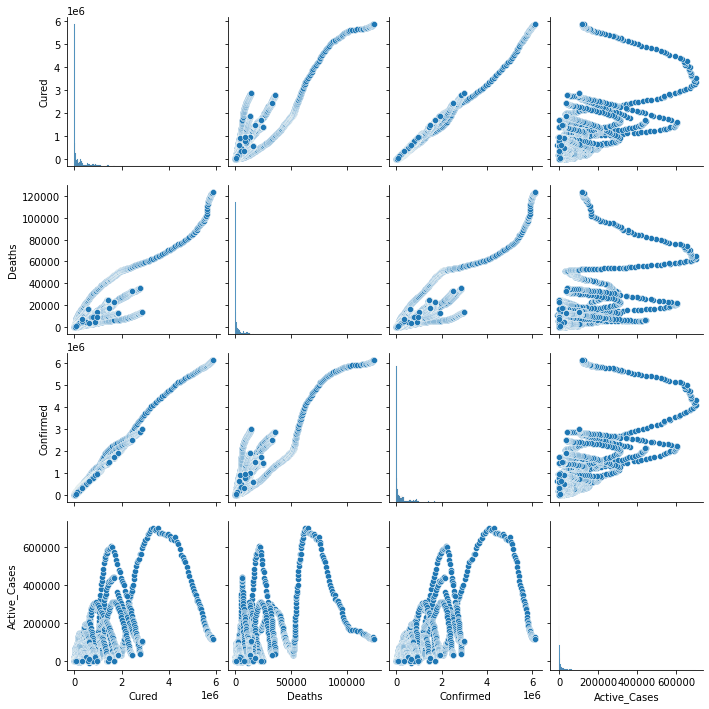

In [25]:
sns.pairplot(covid_data)

## Maharastra Data

In [26]:
Data_mh=pd.DataFrame(covid_data,columns=['Date','Maharashtra','cured','Deaths','Confirmed'])

In [27]:
Data_mh

,Date,Maharashtra,cured,Deaths,Confirmed
0,2020-01-30,NaN,NaN,0,1
1,2020-01-31,NaN,NaN,0,1
2,2020-02-01,NaN,NaN,0,2
3,2020-02-02,NaN,NaN,0,3
4,2020-02-03,NaN,NaN,0,3
...,...,...,...,...,...
16845,2021-07-07,NaN,NaN,3703,628282
16846,2021-07-07,NaN,NaN,701,68612
16847,2021-07-07,NaN,NaN,7338,340882
16848,2021-07-07,NaN,NaN,22656,1706818


In [28]:
Data2 = Data_mh.fillna(0)

In [29]:
Data2

,Date,Maharashtra,cured,Deaths,Confirmed
0,2020-01-30,0.0,0.0,0,1
1,2020-01-31,0.0,0.0,0,1
2,2020-02-01,0.0,0.0,0,2
3,2020-02-02,0.0,0.0,0,3
4,2020-02-03,0.0,0.0,0,3
...,...,...,...,...,...
16845,2021-07-07,0.0,0.0,3703,628282
16846,2021-07-07,0.0,0.0,701,68612
16847,2021-07-07,0.0,0.0,7338,340882
16848,2021-07-07,0.0,0.0,22656,1706818


In [30]:
Data2.tail(10)

,Date,Maharashtra,cured,Deaths,Confirmed
16840,2021-07-07,0.0,0.0,1763,118227
16841,2021-07-07,0.0,0.0,16131,596736
16842,2021-07-07,0.0,0.0,8942,952836
16843,2021-07-07,0.0,0.0,309,21403
16844,2021-07-07,0.0,0.0,33132,2503481
16845,2021-07-07,0.0,0.0,3703,628282
16846,2021-07-07,0.0,0.0,701,68612
16847,2021-07-07,0.0,0.0,7338,340882
16848,2021-07-07,0.0,0.0,22656,1706818
16849,2021-07-07,0.0,0.0,17834,1507241


In [31]:
Data2.describe()

,Maharashtra,cured,Deaths,Confirmed
count,16850.0,16850.0,16850.000000,1.685000e+04
mean,0.0,0.0,3485.222552,2.583667e+05
std,0.0,0.0,9330.541749,5.672808e+05
min,0.0,0.0,0.000000,0.000000e+00
25%,0.0,0.0,22.000000,3.644750e+03
50%,0.0,0.0,453.000000,3.336150e+04
75%,0.0,0.0,3071.250000,2.666530e+05
max,0.0,0.0,123531.000000,6.113335e+06


In [32]:
Data2['Active_Cases'] = Data2['Confirmed'] - (Data2['cured'] + Data2['Deaths'])
Data2.tail()

,Date,Maharashtra,cured,Deaths,Confirmed,Active_Cases
16845,2021-07-07,0.0,0.0,3703,628282,624579.0
16846,2021-07-07,0.0,0.0,701,68612,67911.0
16847,2021-07-07,0.0,0.0,7338,340882,333544.0
16848,2021-07-07,0.0,0.0,22656,1706818,1684162.0
16849,2021-07-07,0.0,0.0,17834,1507241,1489407.0


In [33]:
total_cases_overall=Data2['Active_Cases'].sum()
print('Total number of Active cases in Maharashtra is',total_cases_overall)

Total number of Active cases in Maharashtra is 4294752074.0


In [45]:
px.scatter(x='Active_Cases',y='Deaths',title='Deaths according to Active Cases',data_frame=Data2)

In [35]:
px.scatter(x='Confirmed',y='Deaths',title='Deaths according to confirmed cases',data_frame=Data2)

In [36]:
fig = px.histogram(x='Active_Cases',data_frame=Data2,title='State wise count')
fig.update_traces(marker_line_width=1,marker_line_color="red")

In [46]:
px.scatter(x='Date',y='Deaths',title='Deaths according to Date',data_frame=Data2)

In [47]:
px.scatter(x='Date',y='Active_Cases',title='Active_Cases according to Date',data_frame=Data2)

In [39]:
px.scatter(x='Date',y='Confirmed',title='Confirmed according to Date',data_frame=Data2)